In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mping
from PIL import Image
import tensorflow as tf
import seaborn as sns
import time
import numpy as np

from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras import layers, Model
from tensorflow.keras.models import load_model

from sklearn.metrics import classification_report, confusion_matrix


In [ ]:
!unzip "/content/drive/MyDrive/al ml/train.zip" -d"/content/drive/MyDrive/al ml"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/al ml/train/mountain/7539.jpg  
  inflating: /content/drive/MyDrive/al ml/train/mountain/7551.jpg  
  inflating: /content/drive/MyDrive/al ml/train/mountain/7560.jpg  
  inflating: /content/drive/MyDrive/al ml/train/mountain/7565.jpg  
  inflating: /content/drive/MyDrive/al ml/train/mountain/7578.jpg  
  inflating: /content/drive/MyDrive/al ml/train/mountain/7581.jpg  
  inflating: /content/drive/MyDrive/al ml/train/mountain/7586.jpg  
  inflating: /content/drive/MyDrive/al ml/train/mountain/7647.jpg  
  inflating: /content/drive/MyDrive/al ml/train/mountain/7652.jpg  
  inflating: /content/drive/MyDrive/al ml/train/mountain/7654.jpg  
  inflating: /content/drive/MyDrive/al ml/train/mountain/7662.jpg  
  inflating: /content/drive/MyDrive/al ml/train/mountain/767.jpg  
  inflating: /content/drive/MyDrive/al ml/train/mountain/7672.jpg  
  inflating: /content/drive/MyDrive/al ml/train/mountain/7679.jpg 

In [ ]:
!ls "/content/drive/MyDrive/Artificial Intelligence and Machine Learning/final assessment/Assignment 1 CNN/train"

buildings  forest  glacier  mountain  sea  street


In [ ]:
!ls "/content/drive/MyDrive/al ml/train/buildings"

0.jpg	   12578.jpg  14916.jpg  17468.jpg  20017.jpg  4600.jpg  7382.jpg
10006.jpg  12590.jpg  14918.jpg  17479.jpg  20027.jpg  4620.jpg  7383.jpg
10014.jpg  125.jpg    14947.jpg  17480.jpg  2002.jpg   4621.jpg  739.jpg
10018.jpg  12602.jpg  14952.jpg  17491.jpg  20048.jpg  4623.jpg  7418.jpg
1001.jpg   12615.jpg  14958.jpg  17495.jpg  20054.jpg  4630.jpg  742.jpg
10029.jpg  12617.jpg  14968.jpg  17503.jpg  2038.jpg   4631.jpg  7439.jpg
10032.jpg  12629.jpg  14984.jpg  17516.jpg  2041.jpg   4634.jpg  7443.jpg
10056.jpg  12632.jpg  14991.jpg  1751.jpg   2043.jpg   463.jpg	 7455.jpg
1009.jpg   12636.jpg  1501.jpg	 17520.jpg  2059.jpg   4667.jpg  7463.jpg
10113.jpg  1263.jpg   15026.jpg  17537.jpg  2069.jpg   4686.jpg  7471.jpg
10126.jpg  12649.jpg  15030.jpg  17539.jpg  2076.jpg   4715.jpg  7478.jpg
1012.jpg   12659.jpg  1503.jpg	 1753.jpg   2083.jpg   4748.jpg  747.jpg
10144.jpg  12668.jpg  15042.jpg  17541.jpg  2088.jpg   4770.jpg  7491.jpg
10151.jpg  12669.jpg  15045.jpg  17545.jpg  20

In [ ]:
!unzip "/content/drive/MyDrive/al ml/test.zip" -d "/content/drive/MyDrive/al ml"

Archive:  /content/drive/MyDrive/al ml/test.zip
   creating: /content/drive/MyDrive/al ml/test/
   creating: /content/drive/MyDrive/al ml/test/buildings/
  inflating: /content/drive/MyDrive/al ml/test/buildings/20057.jpg  
  inflating: /content/drive/MyDrive/al ml/test/buildings/20060.jpg  
  inflating: /content/drive/MyDrive/al ml/test/buildings/20061.jpg  
  inflating: /content/drive/MyDrive/al ml/test/buildings/20064.jpg  
  inflating: /content/drive/MyDrive/al ml/test/buildings/20073.jpg  
  inflating: /content/drive/MyDrive/al ml/test/buildings/20074.jpg  
  inflating: /content/drive/MyDrive/al ml/test/buildings/20078.jpg  
  inflating: /content/drive/MyDrive/al ml/test/buildings/20083.jpg  
  inflating: /content/drive/MyDrive/al ml/test/buildings/20094.jpg  
  inflating: /content/drive/MyDrive/al ml/test/buildings/20096.jpg  
  inflating: /content/drive/MyDrive/al ml/test/buildings/20113.jpg  
  inflating: /content/drive/MyDrive/al ml/test/buildings/20131.jpg  
  inflating: /cont

In [ ]:
train_dir = "/content/drive/MyDrive/al ml/train"
test_dir = "/content/drive/MyDrive/al ml/test"

In [ ]:
#To store corrupted image path
corrupted_images = []

#iterating through each folder
for class_name in sorted(os.listdir(train_dir)):
  class_path = os.path.join(train_dir, class_name)

  #Ensuring its a directory
  if os.path.isdir(class_path):
    for Image_name in os.listdir(class_path):
      image_path = os.path.join(class_path, Image_name)

      #Checking for corrupted images
      try:
        with Image.open(image_path) as img:
          img.verify()
      except (IOError, SyntaxError):
        corrupted_images.append(image_path)
        os.remove(image_path)
        print(f"Removed corrupted image:  {image_path}")

# printing summary
if not corrupted_images:
  print("No corrupted images found")

No corrupted images found


In [ ]:
class_names = sorted([d for d in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, d))])

selected_images = []
selected_labels = []
for class_name in class_names:
  class_path = os.path.join(train_dir, class_name)
  if os.path.isdir(class_path):
    images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png','jpg','jpeg'))]
    #Ensuring the class forlder is not empty
    if images:
      selected_image = os.path.join(class_path, random.choice(images))
      selected_images.append(selected_image)
      selected_labels.append(class_name)

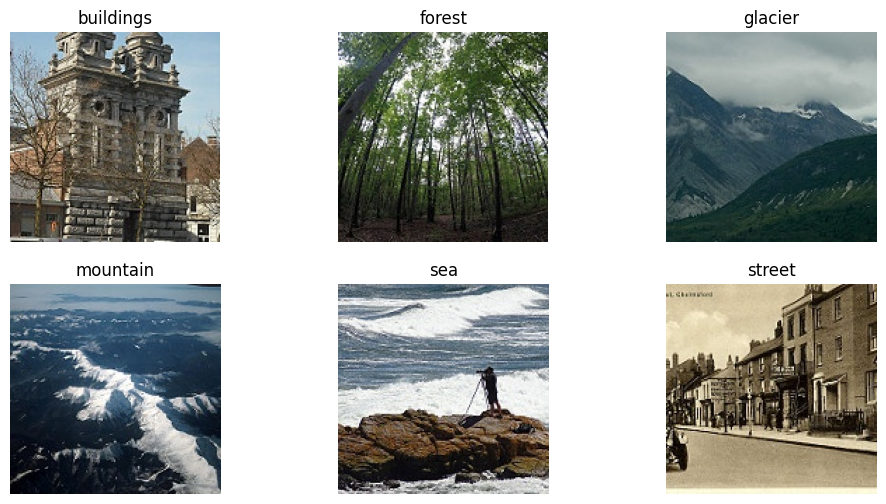

In [ ]:
num_classes = len(selected_images)
cols = (num_classes + 1)//2 #this line determines the column
rows = 2 #fixed row for layout
fig, axes = plt.subplots(rows, cols, figsize = (12,6))
for i, ax in enumerate(axes.flat):
  if i<num_classes:
    img = mping.imread(selected_images[i])
    ax.imshow(img)
    ax.set_title(selected_labels[i])
    ax.axis('off')
  else:
    ax.axis("off")
    plt.tight_layout()
    plt.show()


Class Distribution:
class Name               Valid Image connt
buildings                           2184
forest                              2264
glacier                             2397
mountain                            2505
sea                                 2267
street                              2375
Total number of images: 13992


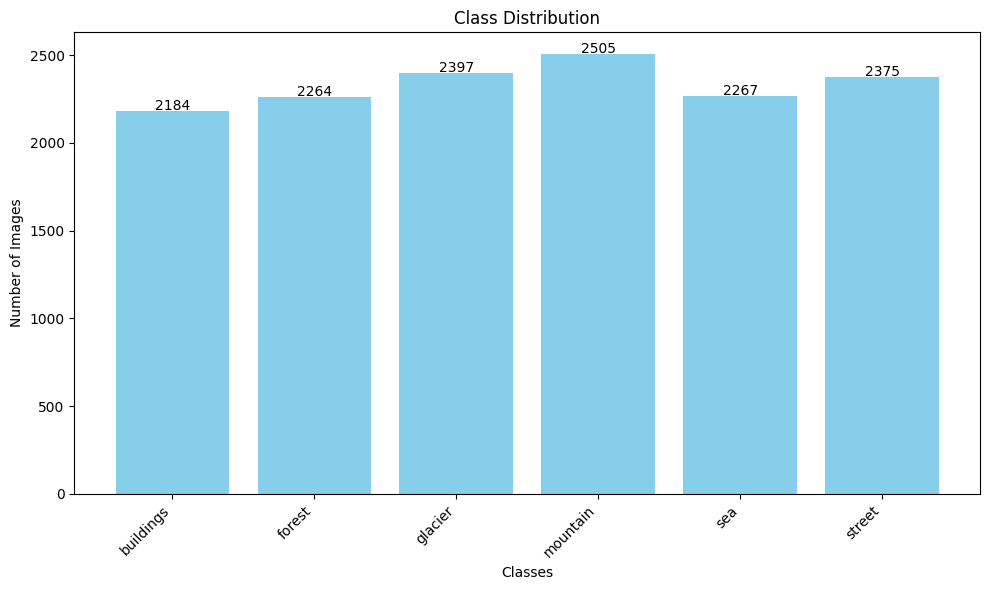

In [ ]:
# showing the count of class
class_counts = {}
for class_name in class_names:
  class_path = os.path.join(train_dir, class_name)
  if os.path.isdir(class_path):
    images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
  class_counts[class_name] = len(images)

  #print class balance
print("\nClass Distribution:")
print("=" * 45)
print(f"{'class Name':<25}{'Valid Image connt':>15}")
print("=" * 45)
for class_name, count in class_counts.items():
  print(f"{class_name:<25}{count:>15}")
print("=" *45)
total_images = sum(class_counts.values())
print(f"Total number of images: {total_images}")

# Visualize class distribution
plt.figure(figsize=(10, 6))
plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
plt.title('Class Distribution')
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.xticks(rotation=45, ha='right')
for i, count in enumerate(class_counts.values()):
    plt.text(i, count + 5, str(count), ha='center')
plt.tight_layout()
plt.show()

In [ ]:
#setting image dimentions and batch size
img_height, img_width = 128,128
batch_size = 32
validation_split = 0.2
seed = 123

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    validation_split = 0.2,
    subset = "training",
    seed =123,
    image_size = (img_height, img_width),
    batch_size = batch_size,
    label_mode = "int"
)
val_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    validation_split = 0.2,
    subset = "validation",
    seed = 123,
    image_size = (img_height, img_width),
    batch_size = batch_size,
    label_mode = "int"
)

train_ds = train_ds.prefetch(buffer_size = tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size = tf.data.AUTOTUNE)


Found 13992 files belonging to 6 classes.
Using 11194 files for training.
Found 13992 files belonging to 6 classes.
Using 2798 files for validation.


In [ ]:
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size = (img_height, img_width),
    batch_size = batch_size,
    label_mode = "int",
    shuffle = False
)

test_ds = test_ds.prefetch(buffer_size = tf.data.AUTOTUNE)



Found 3000 files belonging to 6 classes.


In [ ]:
# Augmentating data
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomTranslation(0.1,0.1),
    layers.RandomContrast(0.2),
], name = "data_augmentation")

rescale = layers.Rescaling(1./255)

In [ ]:
# Apply augmentation + rescale to training set
train_ds = train_ds.map(lambda x, y: (rescale(data_augmentation(x, training=True)), y))

# Apply only rescale to validation set
val_ds = val_ds.map(lambda x, y: (rescale(x), y))

# Prefetch (performance optimization)
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)



test_ds = test_ds.map(lambda x, y: (rescale(x), y))
test_ds = test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

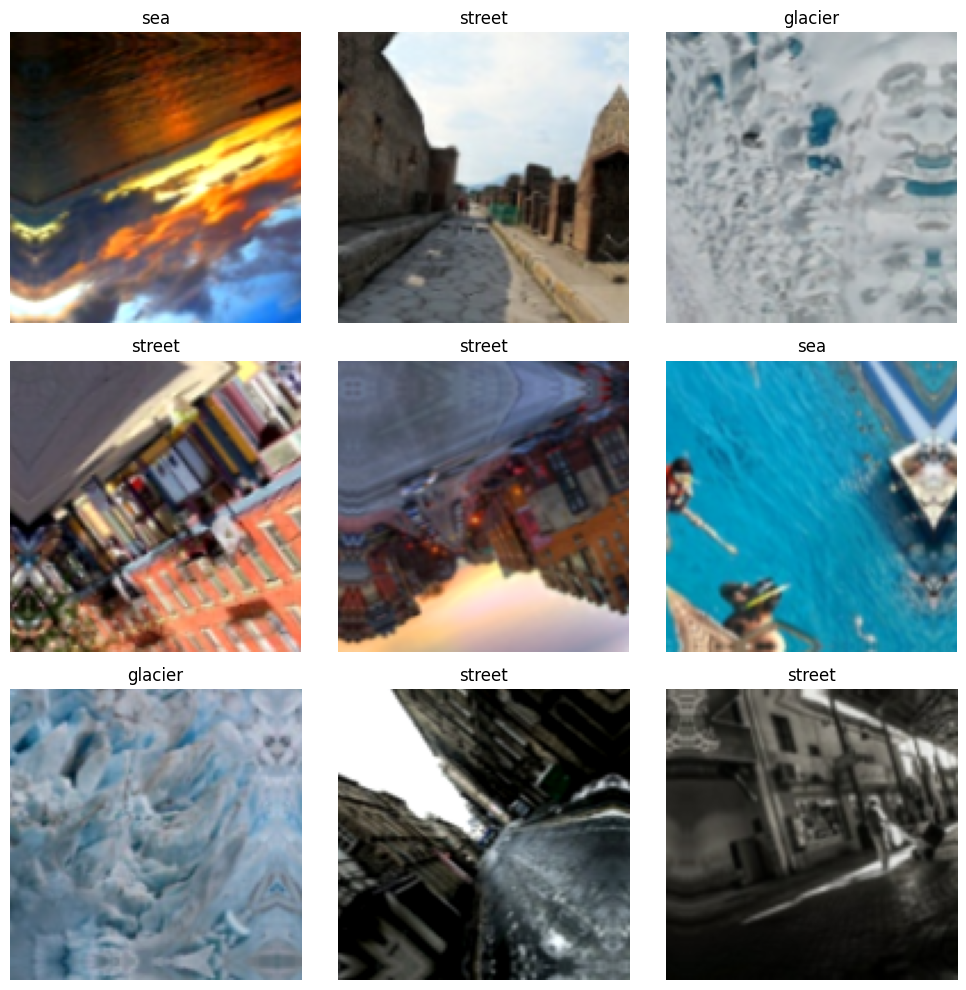

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(min(9, len(images))):
        img = images[i].numpy()
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(img)
        plt.title(class_names[labels[i]])
        plt.axis("off")
plt.tight_layout()
plt.show()


#Baseline CNN model

In [ ]:
# Define the baseline CNN model function
def create_baseline_model(input_shape, num_classes):
    model = tf.keras.Sequential([
        # Input layer
        layers.Input(shape=input_shape),


        # First Convolutional Block
        layers.Conv2D(32, (3, 3), activation='relu', padding='same', name='conv1_1'),
        layers.MaxPooling2D((2, 2), name='pool1'),

        # Second Convolutional Block
        layers.Conv2D(64, (3, 3), activation='relu', padding='same', name='conv2_1'),
        layers.MaxPooling2D((2, 2), name='pool2'),

        # Third Convolutional Block
        layers.Conv2D(128, (3, 3), activation='relu', padding='same', name='conv3_1'),
        layers.MaxPooling2D((2, 2), name='pool3'),

        # Flatten layer
        layers.Flatten(name='flatten'),

        # Three Fully Connected Layers
        layers.Dense(512, activation='relu', name='dense1'),
        layers.Dense(256, activation='relu', name='dense2'),
        layers.Dense(128, activation='relu', name='dense3'),

        # Output layer
        layers.Dense(num_classes, activation='softmax', name='output')
    ])

    return model

# Create the baseline model
input_shape = (img_height, img_width, 3)
baseline_model = create_baseline_model(input_shape, num_classes)

# Print model summary
baseline_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1_1 (Conv2D)                │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2_1 (Conv2D)                │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool2 (MaxPooling2D)            │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3_1 (Conv2D)                │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool3 (MaxPooling2D)            │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense1 (Dense)                  │ (None, 512)            │    16,777,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense2 (Dense)                  │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense3 (Dense)                  │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,035,974 (64.99 MB)

 Trainable params: 17,035,974 (64.99 MB)

 Non-trainable params: 0 (0.00 B)

#Compiling the baseline model

In [ ]:
baseline_model.compile(
    optimizer = 'adam',
    loss = 'sparse_categorical_crossentropy',
    metrics = ['accuracy']
)

#train the baseline model
start_time_baseline = time.time()

history_baseline = baseline_model.fit(
    train_ds,
    validation_data = val_ds,
    epochs = 10,
    verbose = 1
)

baseline_training_time = time.time() - start_time_baseline
print(f"Training time for baseline model: {baseline_training_time:.2f} seconds")

Epoch 1/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 105s 271ms/step - accuracy: 0.6239 - loss: 1.0518 - val_accuracy: 0.6615 - val_loss: 0.9384
Epoch 2/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 93s 265ms/step - accuracy: 0.6539 - loss: 0.9577 - val_accuracy: 0.6919 - val_loss: 0.9676
Epoch 3/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 93s 264ms/step - accuracy: 0.6851 - loss: 0.8901 - val_accuracy: 0.6112 - val_loss: 1.3684
Epoch 4/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 90s 255ms/step - accuracy: 0.7154 - loss: 0.8443 - val_accuracy: 0.6601 - val_loss: 0.9916
Epoch 5/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 88s 252ms/step - accuracy: 0.7263 - loss: 0.8013 - val_accuracy: 0.6690 - val_loss: 1.0157
Epoch 6/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 147s 265ms/step - accuracy: 0.7302 - loss: 0.7862 - val_accuracy: 0.7051 - val_loss: 0.8433
Epoch 7/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 89s 254ms/step - accuracy: 0.7411 - loss: 0.7502 - val_accuracy: 0.7105 - val_loss: 0.9017
Epoch 8/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 147s 268ms/step - accuracy: 0.7547 - loss

In [ ]:
import pickle
baseline_model.save('/content/drive/MyDrive/ai ml/baseline_model.h5')


with open('/content/drive/MyDrive/ai ml/history_baseline.pkl', 'wb') as f:
    pickle.dump(history_baseline.history, f)


#Loading the model and history

In [ ]:
from tensorflow.keras.models import load_model
import pickle

# Load trained baseline model
baseline_model = load_model('/content/drive/MyDrive/ai ml/baseline_model (1).h5')

# Compile it for evaluation (required)
baseline_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Load saved history
with open('/content/drive/MyDrive/ai ml/history_baseline.pkl', 'rb') as f:
    history_data = pickle.load(f)

# Wrap history dict in a mock object to use .history format
class History:
    def __init__(self, history):
        self.history = history

history_baseline = History(history_data)


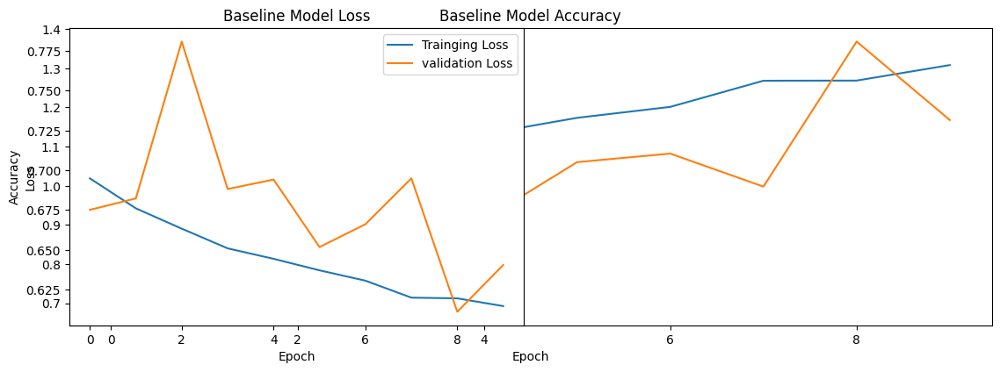

Best validation accuracy:  0.7809 at epoch 9


In [ ]:
plt.figure(figsize = (12,5))

#plotting accuracy
plt.plot(history_baseline.history['accuracy'], label = 'Trainging Accuracy')
plt.plot(history_baseline.history['val_accuracy'],label = 'Validation Accuracy')
plt.title('Baseline Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

#plotting Loss
plt.subplot(1,2,1)
plt.plot(history_baseline.history['loss'], label = 'Trainging Loss')
plt.plot(history_baseline.history['val_loss'], label = 'validation Loss')
plt.title('Baseline Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

#getting the best validation accuracy
best_val_acc = max(history_baseline.history['val_accuracy'])
best_epoch = history_baseline.history['val_accuracy'].index(best_val_acc)+1
print(f"Best validation accuracy: {best_val_acc: .4f} at epoch {best_epoch}")

Evaluating baseline Model on Test set

94/94 ━━━━━━━━━━━━━━━━━━━━ 498s 5s/step - accuracy: 0.7683 - loss: 0.6558

✅ Test Accuracy: 0.7207
❌ Test Loss: 0.7627
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step

📊 Classification Report:
              precision    recall  f1-score   support

   buildings       0.52      0.76      0.62       437
      forest       0.85      0.95      0.90       474
     glacier       0.78      0.66      0.71       553
    mountain       0.77      0.57      0.65       525
         sea       0.68      0.74      0.71       510
      street       0.79      0.68      0.73       501

    accuracy                           0.72      3000
   macro avg       0.73      0.73      0.72      3000
weighted avg       0.74      0.72      0.72      3000



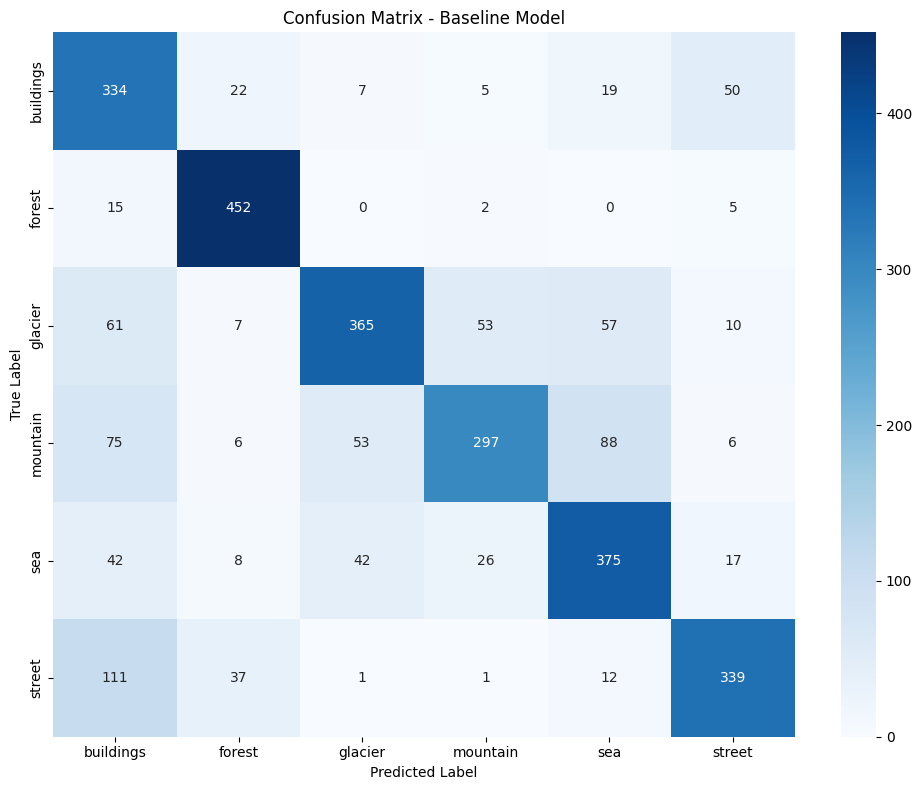

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# Evaluate on test set
test_loss, test_acc = baseline_model.evaluate(test_ds, verbose=1)
print(f"\n✅ Test Accuracy: {test_acc:.4f}")
print(f"❌ Test Loss: {test_loss:.4f}")

# Predict labels
y_pred_probs = baseline_model.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)

# Get true labels
y_true = tf.concat([label for _, label in test_ds], axis=0).numpy()

# Classification report
print("\n📊 Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# Confusion matrix
plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix - Baseline Model")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()


Visualizing sample prediction from baseline model

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 814ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


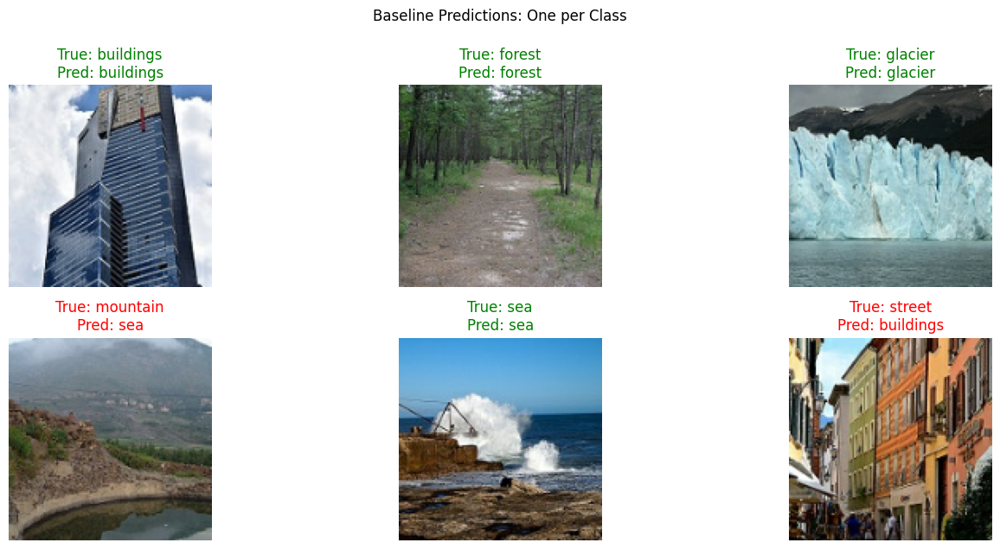

In [ ]:
def plot_one_prediction_per_class(model, ds, class_names):
    num_classes = len(class_names)
    shown_classes = set()

    plt.figure(figsize=(15, 6))

    i = 0
    for images, labels in ds.unbatch().batch(1):  # Go one image at a time
        true_label = labels.numpy()[0]

        if true_label in shown_classes:
            continue

        predictions = model.predict(images)
        predicted_label = np.argmax(predictions[0])

        ax = plt.subplot(2, (num_classes + 1) // 2, i + 1)
        plt.imshow(np.clip(images[0].numpy(), 0, 1))  # Show float image correctly
        color = "green" if predicted_label == true_label else "red"
        plt.title(f"True: {class_names[true_label]}\nPred: {class_names[predicted_label]}", color=color)
        plt.axis("off")

        shown_classes.add(true_label)
        i += 1

        if len(shown_classes) == num_classes:
            break

    plt.tight_layout()
    plt.suptitle("Baseline Predictions: One per Class", y=1.05)
    plt.show()

plot_one_prediction_per_class(baseline_model, test_ds, class_names)


#Exercise 3.1.3


Creating deeper CNN model With Regularization

In [ ]:
input_shape = (128,128,3)

def create_deeper_model(input_shape, num_classes):
    model = tf.keras.Sequential([
        layers.Input(shape=input_shape),

        # 1st Conv Block
        layers.Conv2D(32, (3, 3), padding='same', activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),

        # 2nd Conv Block
        layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),

        # 3rd Conv Block
        layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),

        # 4th Conv Block
        layers.Conv2D(256, (3, 3), padding='same', activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),

        # Use GAP instead of Flatten
        layers.GlobalAveragePooling2D(),
        layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        layers.Dropout(0.2),
        layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001)),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model


deeper_model = create_deeper_model(input_shape, num_classes)
deeper_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 588,358 (2.24 MB)

 Trainable params: 587,398 (2.24 MB)

 Non-trainable params: 960 (3.75 KB)

Compiling and Optimizing using adam

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0003)

deeper_model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)

history = deeper_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=30,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)


Epoch 1/30
350/350 ━━━━━━━━━━━━━━━━━━━━ 114s 302ms/step - accuracy: 0.4962 - loss: 1.3221 - val_accuracy: 0.2684 - val_loss: 2.9729 - learning_rate: 3.0000e-04
Epoch 2/30
350/350 ━━━━━━━━━━━━━━━━━━━━ 108s 307ms/step - accuracy: 0.5978 - loss: 1.0823 - val_accuracy: 0.5901 - val_loss: 1.0924 - learning_rate: 3.0000e-04
Epoch 3/30
350/350 ━━━━━━━━━━━━━━━━━━━━ 125s 260ms/step - accuracy: 0.6237 - loss: 1.0224 - val_accuracy: 0.6240 - val_loss: 1.0418 - learning_rate: 3.0000e-04
Epoch 4/30
350/350 ━━━━━━━━━━━━━━━━━━━━ 146s 272ms/step - accuracy: 0.6490 - loss: 0.9640 - val_accuracy: 0.6898 - val_loss: 0.9055 - learning_rate: 3.0000e-04
Epoch 5/30
350/350 ━━━━━━━━━━━━━━━━━━━━ 137s 258ms/step - accuracy: 0.6662 - loss: 0.9363 - val_accuracy: 0.6430 - val_loss: 1.0265 - learning_rate: 3.0000e-04
Epoch 6/30
350/350 ━━━━━━━━━━━━━━━━━━━━ 91s 259ms/step - accuracy: 0.6815 - loss: 0.8897 - val_accuracy: 0.6451 - val_loss: 0.9817 - learning_rate: 3.0000e-04
Epoch 7/30
350/350 ━━━━━━━━━━━━━━━━━━━━ 0

In [ ]:
import pickle

# Save the trained deeper model
deeper_model.save('/content/drive/MyDrive/Artificial Intelligence and Machine Learning/final assessment/Assignment 1 CNN/deeper_model.h5')

# Save the training history (from the deeper model)
with open('/content/drive/MyDrive/Artificial Intelligence and Machine Learning/final assessment/Assignment 1 CNN/history_deeper.pkl', 'wb') as f:
    pickle.dump(history.history, f)


LOADING THE TRAINED MODEL AND ITS HISTORY

In [ ]:
import pickle

# Load saved history
with open('/content/drive/MyDrive/ai ml/history_deeper.pkl', 'rb') as f:
    history_data = pickle.load(f)

# Wrap in mock object for compatibility
class History:
    def __init__(self, history):
        self.history = history

history_deeper = History(history_data)


Visualizing deeper model with training data

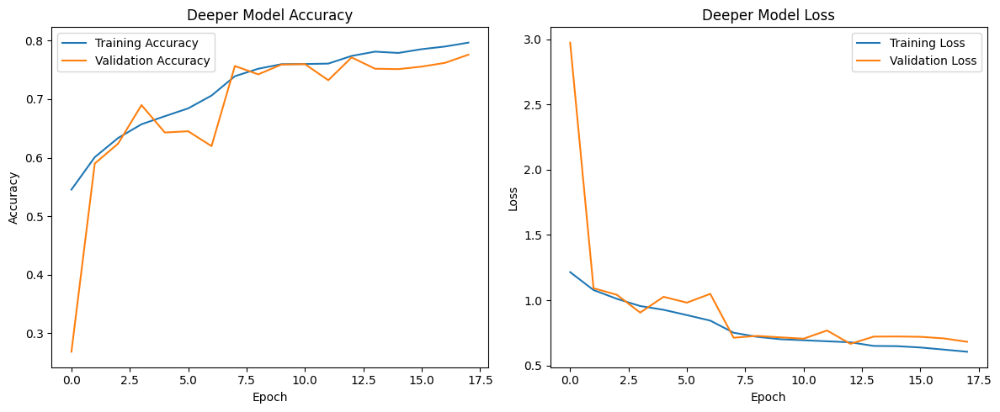

Best validation accuracy: 0.7759 at epoch 18


In [ ]:
# Plot training history for deeper model
plt.figure(figsize=(12, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history_deeper.history['accuracy'], label='Training Accuracy')
plt.plot(history_deeper.history['val_accuracy'], label='Validation Accuracy')
plt.title('Deeper Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history_deeper.history['loss'], label='Training Loss')
plt.plot(history_deeper.history['val_loss'], label='Validation Loss')
plt.title('Deeper Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Best validation accuracy
best_val_acc = max(history_deeper.history['val_accuracy'])
best_epoch = history_deeper.history['val_accuracy'].index(best_val_acc) + 1
print(f"Best validation accuracy: {best_val_acc:.4f} at epoch {best_epoch}")


Evluating deeper model on test set

94/94 ━━━━━━━━━━━━━━━━━━━━ 511s 5s/step

📈 Classification Report (Deeper Model):
              precision    recall  f1-score   support

   buildings       0.56      0.84      0.67       437
      forest       0.92      0.94      0.93       474
     glacier       0.75      0.69      0.72       553
    mountain       0.81      0.66      0.72       525
         sea       0.77      0.78      0.77       510
      street       0.84      0.69      0.76       501

    accuracy                           0.76      3000
   macro avg       0.77      0.77      0.76      3000
weighted avg       0.78      0.76      0.76      3000



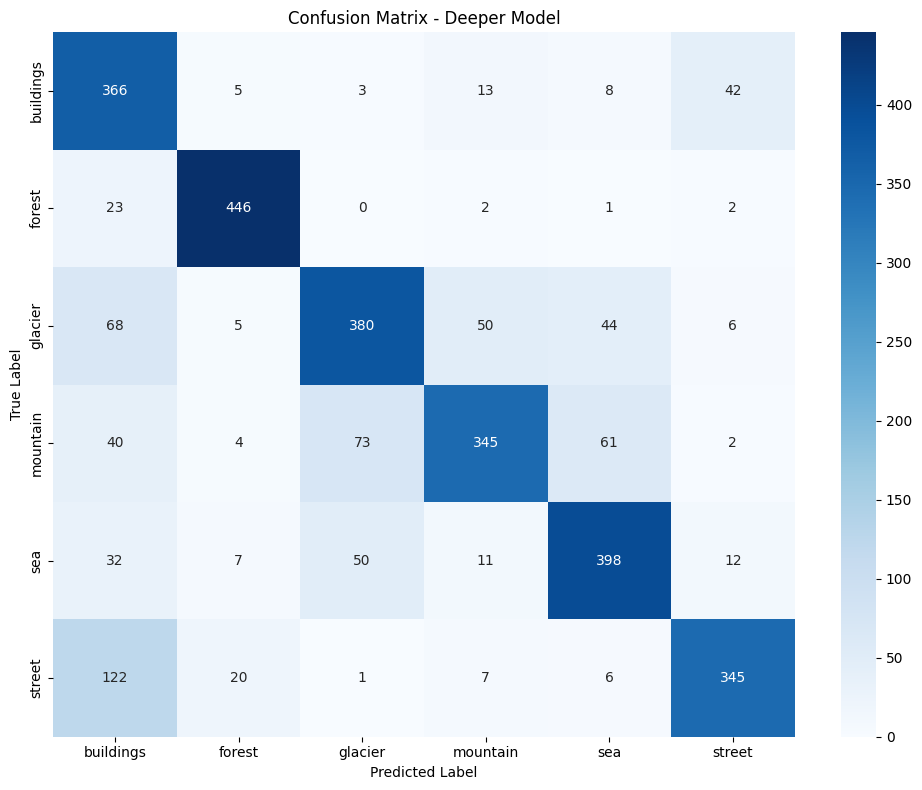


🔍 Visualizing predictions for class: buildings


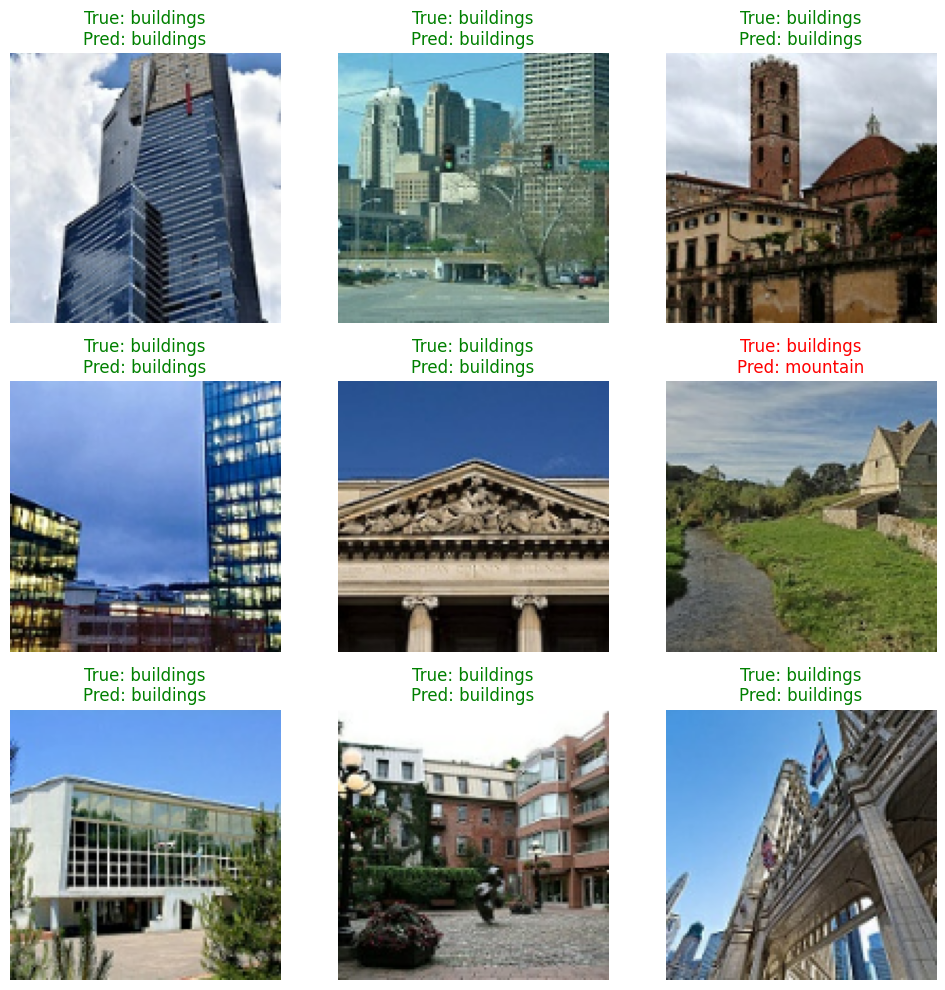


🔍 Visualizing predictions for class: forest


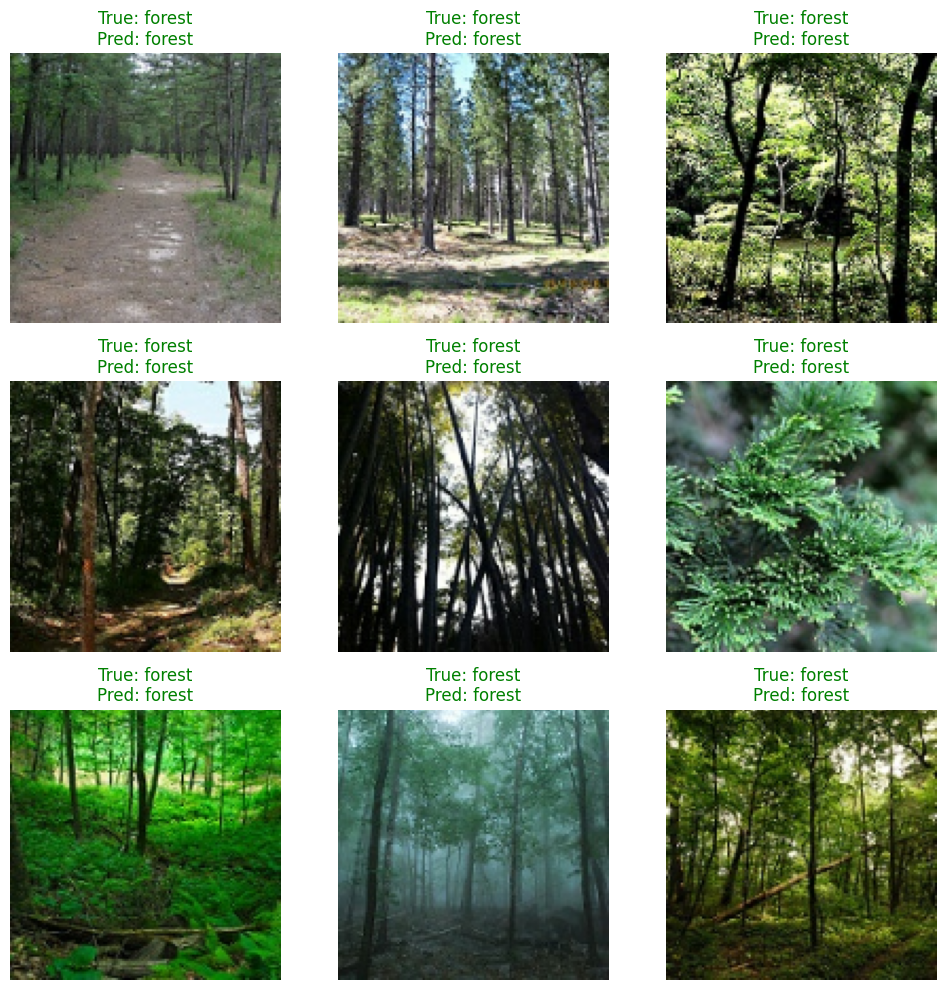


🔍 Visualizing predictions for class: glacier


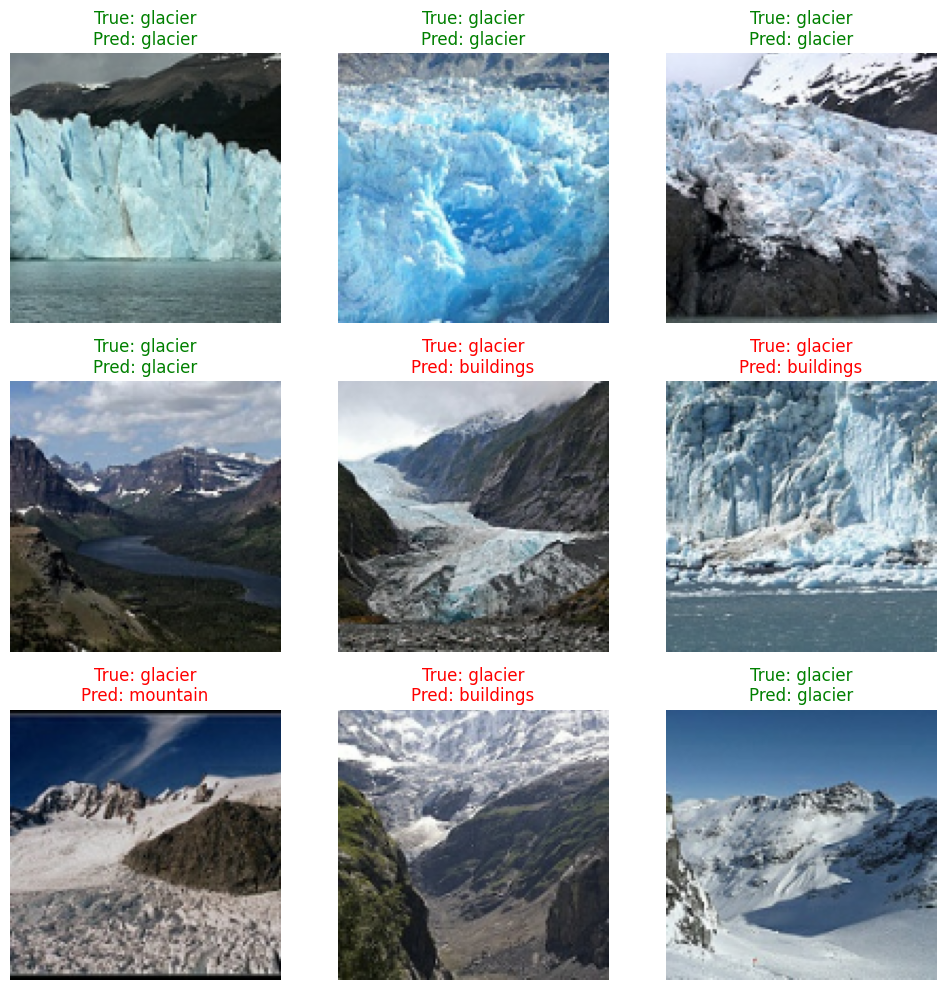


🔍 Visualizing predictions for class: mountain


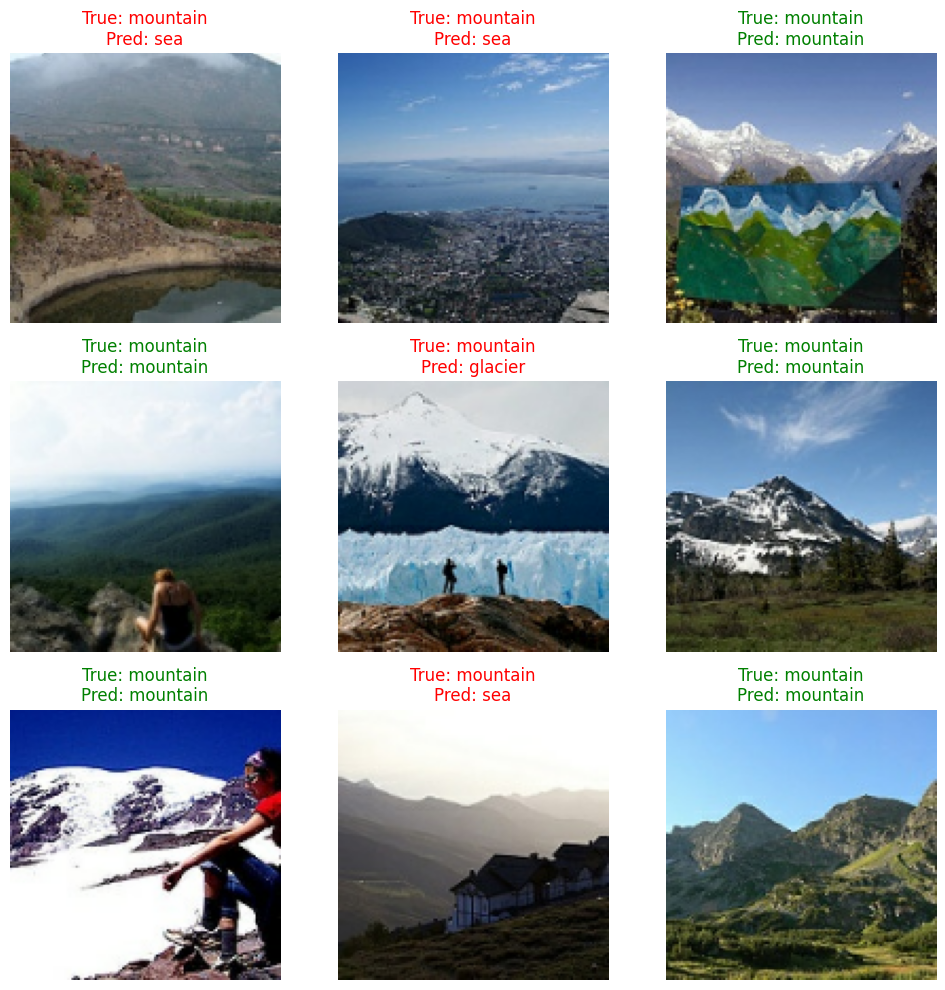


🔍 Visualizing predictions for class: sea


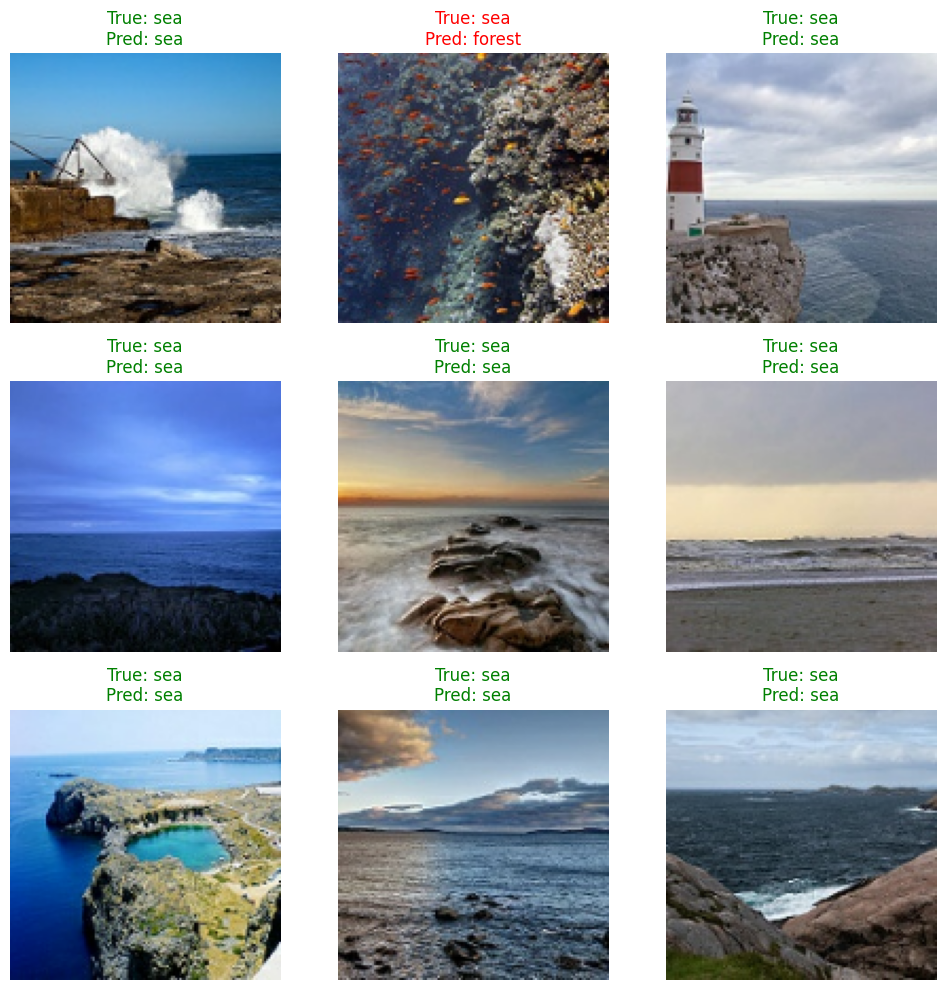


🔍 Visualizing predictions for class: street


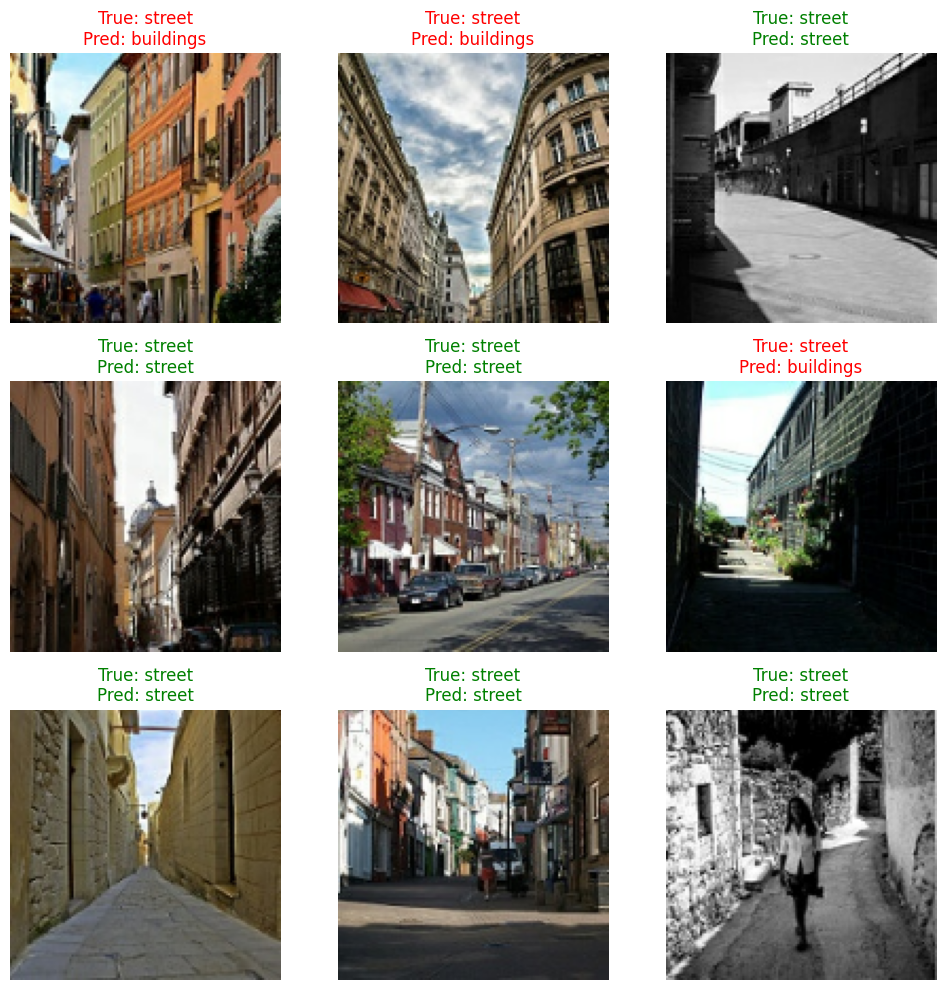

In [ ]:
from tensorflow.keras.models import load_model
import numpy as np
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# 🔁 Load pre-trained model (NO compile needed)
deeper_model
# ✅ Recompile for evaluation & prediction (won't affect weights)
deeper_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)



# 🔮 Generate predictions
deeper_predictions = deeper_model.predict(test_ds)
deeper_y_pred = np.argmax(deeper_predictions, axis=1)

# 🧾 Rebuild true labels from test dataset
true_labels = tf.concat([label for _, label in test_ds], axis=0).numpy()

# 📊 Classification Report
print("\n📈 Classification Report (Deeper Model):")
print(classification_report(true_labels, deeper_y_pred, target_names=class_names))

# 🔁 Confusion Matrix
plt.figure(figsize=(10, 8))
cm = confusion_matrix(true_labels, deeper_y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix - Deeper Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.tight_layout()
plt.show()
def plot_class_samples(model, dataset, class_names, target_class, num_images=9):
    import matplotlib.pyplot as plt

    plt.figure(figsize=(10, 10))
    class_index = class_names.index(target_class)
    count = 0

    for images, labels in dataset.unbatch():
        if count >= num_images:
            break
        if labels.numpy() == class_index:
            # Predict
            prediction = model.predict(tf.expand_dims(images, 0), verbose=0)
            predicted_label = np.argmax(prediction)
            predicted_class = class_names[predicted_label]

            # Image rendering
            ax = plt.subplot(3, 3, count + 1)
            plt.imshow((images.numpy() * 255).astype("uint8"))
            plt.axis("off")

            # Color code based on correctness
            if predicted_label == class_index:
                color = 'green'
            else:
                color = 'red'

            plt.title(f"True: {target_class}\nPred: {predicted_class}", color=color)
            count += 1

    plt.tight_layout()
    plt.show()


# Visualize sample predictions (ensure this function is defined)
for class_name in class_names:
    print(f"\n🔍 Visualizing predictions for class: {class_name}")
    plot_class_samples(deeper_model, test_ds, class_names, target_class=class_name)



Now to train deeper model using SGD optimizer


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import time

# Define input shape and number of classes
input_shape = (128, 128, 3)
num_classes = len(class_names)

# Create a new instance of the deeper model
deeper_model_sgd = create_deeper_model(input_shape, num_classes)

# Compile with SGD optimizer
sgd_optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
deeper_model_sgd.compile(
    optimizer=sgd_optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# 🌟 Callbacks
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,         # Reduce LR by 20%
    patience=2,         # If no improvement in 2 epochs
    min_lr=1e-6,        # Minimum LR threshold
    verbose=1
)

# ⏱️ Train the model with callbacks
start_time_sgd = time.time()

history_sgd = deeper_model_sgd.fit(
    train_ds,
    validation_data=val_ds,
    epochs=20,
    verbose=1,
    callbacks=[early_stop, reduce_lr]
)

sgd_training_time = time.time() - start_time_sgd
print(f"Training time with SGD + EarlyStopping + ReduceLROnPlateau: {sgd_training_time:.2f} seconds")


Epoch 1/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 104s 279ms/step - accuracy: 0.4727 - loss: 1.3834 - val_accuracy: 0.4907 - val_loss: 1.3776 - learning_rate: 0.0100
Epoch 2/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 94s 268ms/step - accuracy: 0.5651 - loss: 1.1750 - val_accuracy: 0.6315 - val_loss: 1.0117 - learning_rate: 0.0100
Epoch 3/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 90s 256ms/step - accuracy: 0.5938 - loss: 1.1008 - val_accuracy: 0.4478 - val_loss: 1.5429 - learning_rate: 0.0100
Epoch 4/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 90s 255ms/step - accuracy: 0.6205 - loss: 1.0505 - val_accuracy: 0.6598 - val_loss: 0.9793 - learning_rate: 0.0100
Epoch 5/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 146s 268ms/step - accuracy: 0.6381 - loss: 1.0126 - val_accuracy: 0.6369 - val_loss: 0.9937 - learning_rate: 0.0100
Epoch 6/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 141s 266ms/step - accuracy: 0.6408 - loss: 1.0035 - val_accuracy: 0.6540 - val_loss: 0.9744 - learning_rate: 0.0100
Epoch 7/20
350/350 ━━━━━━━━━━━━━━━━━━━━ 94s 267ms/step - accuracy: 

In [ ]:
import pickle

# Save the SGD-trained model
deeper_model_sgd.save('/content/drive/MyDrive/Artificial Intelligence and Machine Learning/final assessment/Assignment 1 CNN/deeper_model_sgd.h5')

# Save the training history
with open('/content/drive/MyDrive/Artificial Intelligence and Machine Learning/final assessment/Assignment 1 CNN/history_sgd.pkl', 'wb') as f:
    pickle.dump(history_sgd.history, f)


In [ ]:
import pickle
from tensorflow.keras.models import load_model
import tensorflow as tf

# --- Load and compile model for evaluation ---
deeper_model_sgd = load_model('/content/drive/MyDrive/ai ml/deeper_model_sgd.h5')

deeper_model_sgd.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9),
                         loss='sparse_categorical_crossentropy',
                         metrics=['accuracy'])

# --- Load training history from pickle ---
with open('/content/drive/MyDrive/ai ml/history_deeper.pkl', 'rb') as f:
    history_data = pickle.load(f)

# --- Wrap in mock object ---
class History:
    def __init__(self, history):
        self.history = history

history_deeper = History(history_data)


#Comparing baseline model to deeper model optimized by adam and SGD

In [ ]:
baseline_model = load_model('/content/drive/MyDrive/ai ml/baseline_model (1).h5')
baseline_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

deeper_model = load_model('/content/drive/MyDrive/ai ml/deeper_model.h5')
deeper_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

deeper_model_sgd = load_model('/content/drive/MyDrive/ai ml/deeper_model_sgd.h5')
deeper_model_sgd.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9),
                         loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# ---------- Load training history ----------
with open('/content/drive/MyDrive/ai ml/history_baseline.pkl', 'rb') as f:
    history_baseline_data = pickle.load(f)

with open('/content/drive/MyDrive/ai ml/history_deeper.pkl', 'rb') as f:
    history_deeper_data = pickle.load(f)

with open('/content/drive/MyDrive/ai ml/history_sgd.pkl', 'rb') as f:
    history_sgd_data = pickle.load(f)

# ---------- Wrap history in mock objects ----------
class History:
    def __init__(self, history):
        self.history = history

history_baseline = History(history_baseline_data)
history_deeper = History(history_deeper_data)
history_sgd = History(history_sgd_data)

# Optional: assign aliases for compatibility with old code
history = history_deeper

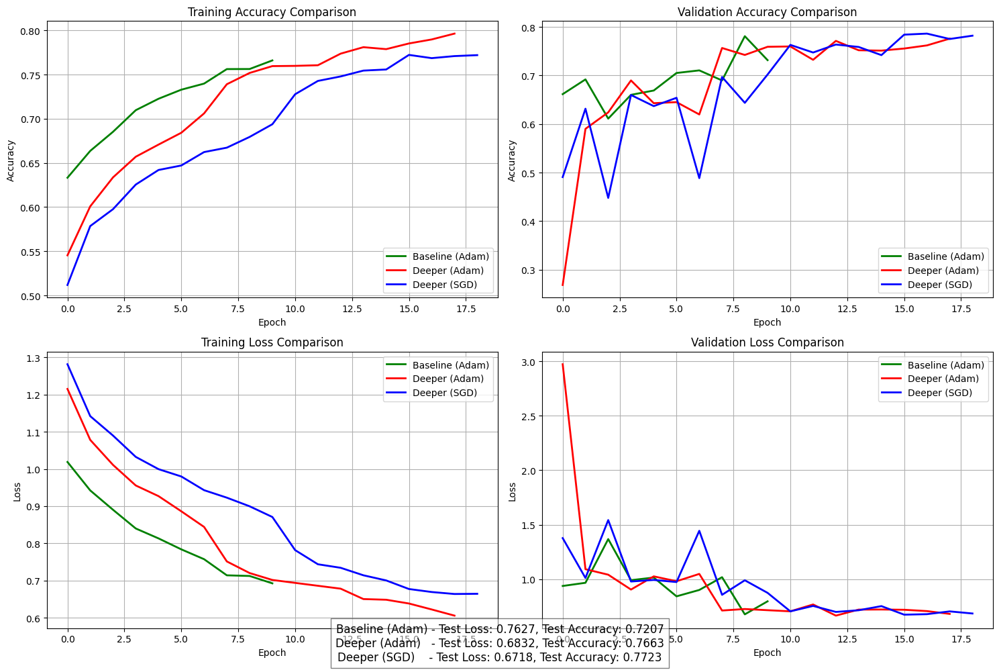

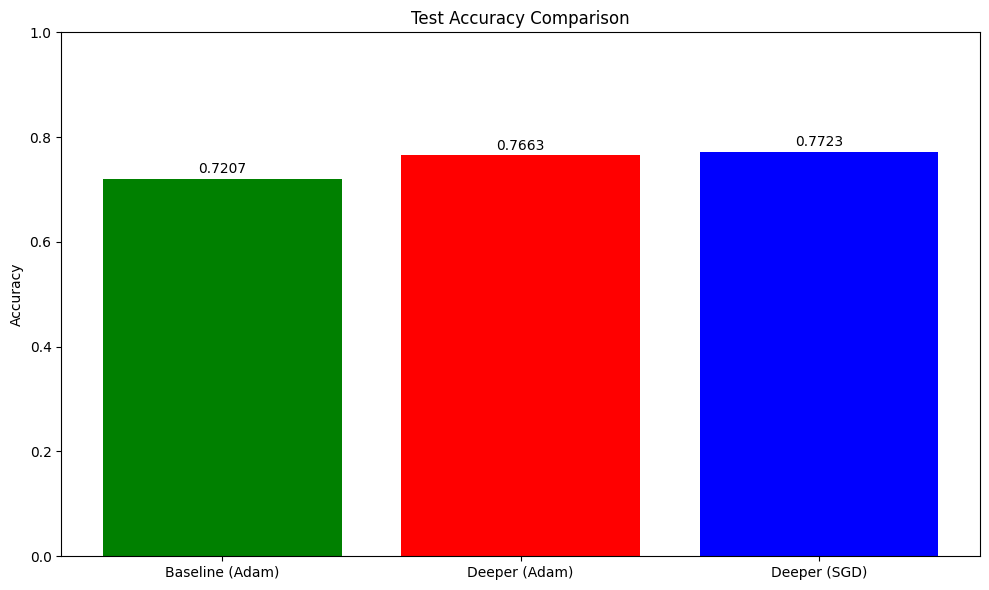

<Figure size 1000x600 with 0 Axes>

In [ ]:
plt.figure(figsize=(15, 10))

# 1. Training Accuracy
plt.subplot(2, 2, 1)
plt.plot(history_baseline.history['accuracy'], 'g-', linewidth=2, label='Baseline (Adam)')
plt.plot(history.history['accuracy'], 'r-', linewidth=2, label='Deeper (Adam)')
plt.plot(history_sgd.history['accuracy'], 'b-', linewidth=2, label='Deeper (SGD)')
plt.title('Training Accuracy Comparison')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.grid(True)

# 2. Validation Accuracy
plt.subplot(2, 2, 2)
plt.plot(history_baseline.history['val_accuracy'], 'g-', linewidth=2, label='Baseline (Adam)')
plt.plot(history.history['val_accuracy'], 'r-', linewidth=2, label='Deeper (Adam)')
plt.plot(history_sgd.history['val_accuracy'], 'b-', linewidth=2, label='Deeper (SGD)')
plt.title('Validation Accuracy Comparison')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.grid(True)

# 3. Training Loss
plt.subplot(2, 2, 3)
plt.plot(history_baseline.history['loss'], 'g-', linewidth=2, label='Baseline (Adam)')
plt.plot(history.history['loss'], 'r-', linewidth=2, label='Deeper (Adam)')
plt.plot(history_sgd.history['loss'], 'b-', linewidth=2, label='Deeper (SGD)')
plt.title('Training Loss Comparison')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.grid(True)

# 4. Validation Loss
plt.subplot(2, 2, 4)
plt.plot(history_baseline.history['val_loss'], 'g-', linewidth=2, label='Baseline (Adam)')
plt.plot(history.history['val_loss'], 'r-', linewidth=2, label='Deeper (Adam)')
plt.plot(history_sgd.history['val_loss'], 'b-', linewidth=2, label='Deeper (SGD)')
plt.title('Validation Loss Comparison')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.grid(True)

plt.tight_layout()

# ---------- Evaluate all models on test data ----------
# NOTE: You must define `test_ds` earlier in your notebook
baseline_results = baseline_model.evaluate(test_ds, verbose=0)
adam_results = deeper_model.evaluate(test_ds, verbose=0)
sgd_results = deeper_model_sgd.evaluate(test_ds, verbose=0)

# Add test metrics at the bottom
plt.figtext(0.5, 0.01,
           f"Baseline (Adam) - Test Loss: {baseline_results[0]:.4f}, Test Accuracy: {baseline_results[1]:.4f}\n"
           f"Deeper (Adam)   - Test Loss: {adam_results[0]:.4f}, Test Accuracy: {adam_results[1]:.4f}\n"
           f"Deeper (SGD)    - Test Loss: {sgd_results[0]:.4f}, Test Accuracy: {sgd_results[1]:.4f}",
           ha="center", fontsize=12, bbox={"facecolor":"white", "alpha":0.5, "pad":5})

plt.show()

# ---------- Create bar chart: Test Accuracy ----------
plt.figure(figsize=(10, 6))
models = ['Baseline (Adam)', 'Deeper (Adam)', 'Deeper (SGD)']
accuracies = [baseline_results[1], adam_results[1], sgd_results[1]]
colors = ['green', 'red', 'blue']

plt.bar(models, accuracies, color=colors)
plt.title('Test Accuracy Comparison')
plt.ylabel('Accuracy')
plt.ylim(0, 1)

# Add labels on top
for i, acc in enumerate(accuracies):
    plt.text(i, acc + 0.01, f'{acc:.4f}', ha='center')

plt.tight_layout()
plt.show()

# ---------- (Optional) Create bar chart: Training Time ----------
try:
    plt.figure(figsize=(10, 6))
    times = [
        baseline_training_time if 'baseline_training_time' in globals() else 0,
        adam_training_time if 'adam_training_time' in globals() else 0,
        sgd_training_time if 'sgd_training_time' in globals() else 0
    ]

    if sum(times) > 0:
        plt.bar(models, times, color=colors)
        plt.title('Training Time Comparison')
        plt.ylabel('Time (seconds)')

        for i, t in enumerate(times):
            if t > 0:
                plt.text(i, t + 1, f'{t:.2f}s', ha='center')

        plt.tight_layout()
        plt.show()
except:
    pass  # Skip if timing data not available

#Comparing Adam vs SGD optimized model

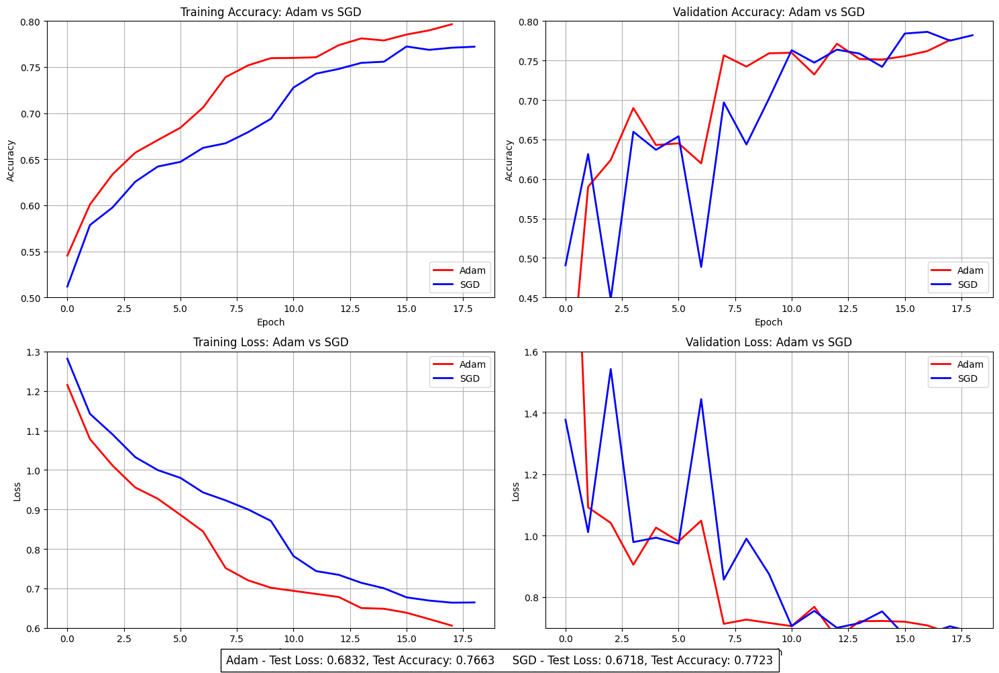

In [ ]:
import matplotlib.pyplot as plt

# Create a figure with 4 subplots
plt.figure(figsize=(15, 10))

# 1. Training Accuracy
plt.subplot(2, 2, 1)
plt.plot(history.history['accuracy'], 'r-', linewidth=2, label='Adam')
plt.plot(history_sgd.history['accuracy'], 'b-', linewidth=2, label='SGD')
plt.title('Training Accuracy: Adam vs SGD')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.grid(True)
plt.ylim(0.5, 0.8)  # Set y-axis limits for better visualization

# 2. Validation Accuracy
plt.subplot(2, 2, 2)
plt.plot(history.history['val_accuracy'], 'r-', linewidth=2, label='Adam')
plt.plot(history_sgd.history['val_accuracy'], 'b-', linewidth=2, label='SGD')
plt.title('Validation Accuracy: Adam vs SGD')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.grid(True)
plt.ylim(0.45, 0.8)  # Set y-axis limits for better visualization

# 3. Training Loss
plt.subplot(2, 2, 3)
plt.plot(history.history['loss'], 'r-', linewidth=2, label='Adam')
plt.plot(history_sgd.history['loss'], 'b-', linewidth=2, label='SGD')
plt.title('Training Loss: Adam vs SGD')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.grid(True)
plt.ylim(0.6, 1.3)  # Set y-axis limits for better visualization

# 4. Validation Loss
plt.subplot(2, 2, 4)
plt.plot(history.history['val_loss'], 'r-', linewidth=2, label='Adam')
plt.plot(history_sgd.history['val_loss'], 'b-', linewidth=2, label='SGD')
plt.title('Validation Loss: Adam vs SGD')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.grid(True)
plt.ylim(0.7, 1.6)  # Set y-axis limits for better visualization

plt.tight_layout()

# Evaluate models and add test metrics as text at the bottom
adam_results = deeper_model.evaluate(test_ds, verbose=0)
sgd_results = deeper_model_sgd.evaluate(test_ds, verbose=0)

# Add test metrics at the bottom
plt.figtext(0.5, 0.005,  # ⬅ move lower
           f"Adam - Test Loss: {adam_results[0]:.4f}, Test Accuracy: {adam_results[1]:.4f}     "
           f"SGD - Test Loss: {sgd_results[0]:.4f}, Test Accuracy: {sgd_results[1]:.4f}",
           ha="center", fontsize=12,
           bbox={"facecolor":"white", "alpha":1.0, "pad":6})  # fully opaque


plt.show()

#Exercise 3.1.4

Experimentation and Comparative Analysis fo Deeper and Baseline models

In [ ]:
#Baseline vs Deeper model performance



#part B

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import time
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Rescaling
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
# Define image dimensions required by VGG16
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# Load datasets with proper image size for transfer learning
train_ds_tl = image_dataset_from_directory(
    '/content/drive/MyDrive/al ml/train',
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    validation_split=0.2,
    subset="training",
    seed=123
)

val_ds_tl = image_dataset_from_directory(
    '/content/drive/MyDrive/al ml/train',
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    validation_split=0.2,
    subset="validation",
    seed=123
)

test_ds_tl = image_dataset_from_directory(
    '/content/drive/MyDrive/al ml/test',
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

Found 13992 files belonging to 6 classes.
Using 11194 files for training.
Found 13992 files belonging to 6 classes.
Using 2798 files for validation.
Found 3000 files belonging to 6 classes.


In [ ]:
# Cell 3: Data Analysis and Preparation
# Get class names and print dataset information
class_names = train_ds_tl.class_names
num_classes = len(class_names)
print(f"Class names: {class_names}")
print(f"Number of classes: {num_classes}")

# Normalize pixel values
normalization_layer = Rescaling(1./255)
train_ds_tl = train_ds_tl.map(lambda x, y: (normalization_layer(x), y))
val_ds_tl = val_ds_tl.map(lambda x, y: (normalization_layer(x), y))
test_ds_tl = test_ds_tl.map(lambda x, y: (normalization_layer(x), y))

# Performance optimization
AUTOTUNE = tf.data.AUTOTUNE
train_ds_tl = train_ds_tl.prefetch(buffer_size=AUTOTUNE)
val_ds_tl = val_ds_tl.prefetch(buffer_size=AUTOTUNE)
test_ds_tl = test_ds_tl.prefetch(buffer_size=AUTOTUNE)


Class names: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Number of classes: 6


In [ ]:
# Cell 4: Feature Extraction Model Building
print("Building the transfer learning model - Feature Extraction Phase...")

# Load VGG16 pre-trained on ImageNet without top layers
base_model = VGG16(include_top=False,
                  weights='imagenet',
                  input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3))

# Freeze all layers in the base model (Feature Extraction approach)
for layer in base_model.layers:
    layer.trainable = False

# Add custom classification head
input_layer = Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3))
x = base_model(input_layer)
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)  # Add dropout for regularization
output = Dense(num_classes, activation='softmax')(x)

# Create the feature extraction model
model_feature_extraction = Model(inputs=input_layer, outputs=output)

# Compile with appropriate loss function and optimizer
model_feature_extraction.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Print model summary
print("Feature Extraction Model Summary:")
model_feature_extraction.summary()

# Cell 5: Training the Feature Extraction Model
print("\nTraining Feature Extraction Model...")
start_time = time.time()

# Define callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
]

# Train the model
history_feature_extraction = model_feature_extraction.fit(
    train_ds_tl,
    validation_data=val_ds_tl,
    epochs=15,
    callbacks=callbacks
)

feature_extraction_time = time.time() - start_time
print(f"Feature extraction training time: {feature_extraction_time:.2f} seconds")

Building the transfer learning model - Feature Extraction Phase...
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Feature Extraction Model Summary:


Model: "functional_113"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,847,558 (56.64 MB)

 Trainable params: 132,870 (519.02 KB)

 Non-trainable params: 14,714,688 (56.13 MB)


Training Feature Extraction Model...
Epoch 1/15
350/350 ━━━━━━━━━━━━━━━━━━━━ 126s 288ms/step - accuracy: 0.3088 - loss: 1.7080 - val_accuracy: 0.7495 - val_loss: 0.9859
Epoch 2/15
350/350 ━━━━━━━━━━━━━━━━━━━━ 109s 238ms/step - accuracy: 0.6567 - loss: 0.9723 - val_accuracy: 0.7784 - val_loss: 0.7370
Epoch 3/15
350/350 ━━━━━━━━━━━━━━━━━━━━ 77s 221ms/step - accuracy: 0.7298 - loss: 0.7540 - val_accuracy: 0.7984 - val_loss: 0.6296
Epoch 4/15
350/350 ━━━━━━━━━━━━━━━━━━━━ 87s 237ms/step - accuracy: 0.7815 - loss: 0.6465 - val_accuracy: 0.8120 - val_loss: 0.5649
Epoch 5/15
350/350 ━━━━━━━━━━━━━━━━━━━━ 136s 221ms/step - accuracy: 0.7880 - loss: 0.5969 - val_accuracy: 0.8199 - val_loss: 0.5198
Epoch 6/15
350/350 ━━━━━━━━━━━━━━━━━━━━ 77s 220ms/step - accuracy: 0.8037 - loss: 0.5503 - val_accuracy: 0.8270 - val_loss: 0.4892
Epoch 7/15
350/350 ━━━━━━━━━━━━━━━━━━━━ 77s 220ms/step - accuracy: 0.8187 - loss: 0.5115 - val_accuracy: 0.8363 - val_loss: 0.4669
Epoch 8/15
350/350 ━━━━━━━━━━━━━━━━━━━━ 82

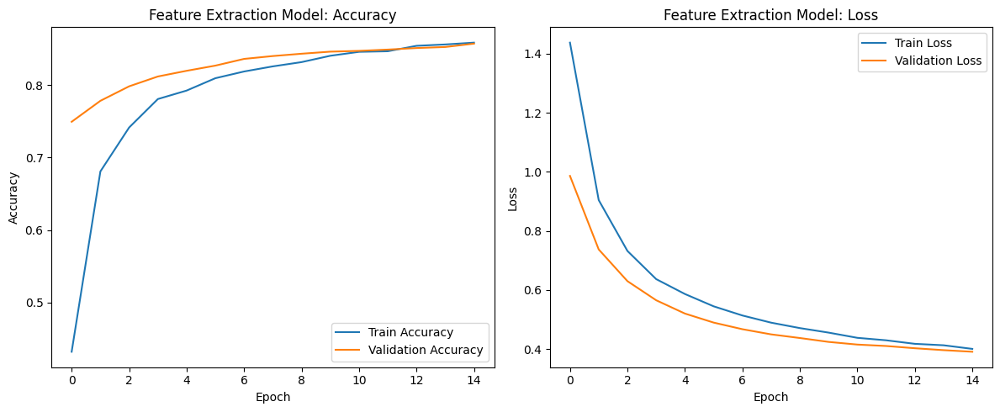

In [ ]:
# Plot training history for feature extraction
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history_feature_extraction.history['accuracy'], label='Train Accuracy')
plt.plot(history_feature_extraction.history['val_accuracy'], label='Validation Accuracy')
plt.title('Feature Extraction Model: Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_feature_extraction.history['loss'], label='Train Loss')
plt.plot(history_feature_extraction.history['val_loss'], label='Validation Loss')
plt.title('Feature Extraction Model: Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.savefig('feature_extraction_training.png')
plt.show()


In [ ]:
# Evaluate Feature Extraction Model
feature_extraction_results = model_feature_extraction.evaluate(test_ds_tl)
print(f"Feature Extraction Model - Test Loss: {feature_extraction_results[0]:.4f}, Test Accuracy: {feature_extraction_results[1]:.4f}")


94/94 ━━━━━━━━━━━━━━━━━━━━ 27s 285ms/step - accuracy: 0.8602 - loss: 0.3890
Feature Extraction Model - Test Loss: 0.3932, Test Accuracy: 0.8573


In [ ]:
print("\nImplementing Fine-Tuning Phase...")

# Create a new model for fine-tuning
base_model_ft = VGG16(include_top=False,
                     weights='imagenet',
                     input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3))

# First, freeze all layers
for layer in base_model_ft.layers:
    layer.trainable = False

# Then, unfreeze the last convolutional block for fine-tuning
# VGG16's last convolutional block starts at 'block5_conv1'
fine_tune_at = 15  # This will unfreeze the last convolutional block
for layer in base_model_ft.layers[fine_tune_at:]:
    layer.trainable = True

# Add custom classification head (same as before)
input_layer_ft = Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3))
x_ft = base_model_ft(input_layer_ft)
x_ft = GlobalAveragePooling2D()(x_ft)
x_ft = Dense(256, activation='relu')(x_ft)
x_ft = Dropout(0.5)(x_ft)  # Add dropout for regularization
output_ft = Dense(num_classes, activation='softmax')(x_ft)

# Create the fine-tuning model
model_fine_tuning = Model(inputs=input_layer_ft, outputs=output_ft)

# Compile with a LOWER learning rate for fine-tuning
model_fine_tuning.compile(
    optimizer=Adam(learning_rate=0.00001),  # 10x lower learning rate
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Print model summary
print("Fine-tuned Model Summary (Note trainable parameters):")
model_fine_tuning.summary()


Implementing Fine-Tuning Phase...
Fine-tuned Model Summary (Note trainable parameters):


Model: "functional_114"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,847,558 (56.64 MB)

 Trainable params: 7,212,294 (27.51 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

In [ ]:
print("\nTraining Fine-tuned Model...")
start_time_ft = time.time()

# Train the fine-tuned model
history_fine_tuning = model_fine_tuning.fit(
    train_ds_tl,
    validation_data=val_ds_tl,
    epochs=10,
    callbacks=callbacks
)

fine_tuning_time = time.time() - start_time_ft
print(f"Fine-tuning training time: {fine_tuning_time:.2f} seconds")


Training Fine-tuned Model...
Epoch 1/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 98s 263ms/step - accuracy: 0.4950 - loss: 1.2406 - val_accuracy: 0.8513 - val_loss: 0.4171
Epoch 2/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 88s 251ms/step - accuracy: 0.8409 - loss: 0.4509 - val_accuracy: 0.8785 - val_loss: 0.3569
Epoch 3/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 142s 252ms/step - accuracy: 0.8751 - loss: 0.3551 - val_accuracy: 0.8903 - val_loss: 0.3163
Epoch 4/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 88s 251ms/step - accuracy: 0.8938 - loss: 0.3100 - val_accuracy: 0.8888 - val_loss: 0.3166
Epoch 5/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 88s 251ms/step - accuracy: 0.9023 - loss: 0.2809 - val_accuracy: 0.8949 - val_loss: 0.2921
Epoch 6/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 93s 266ms/step - accuracy: 0.9119 - loss: 0.2607 - val_accuracy: 0.8985 - val_loss: 0.2845
Epoch 7/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 88s 251ms/step - accuracy: 0.9211 - loss: 0.2348 - val_accuracy: 0.9064 - val_loss: 0.2781
Epoch 8/10
350/350 ━━━━━━━━━━━━━━━━━━━━ 142s 252ms/s

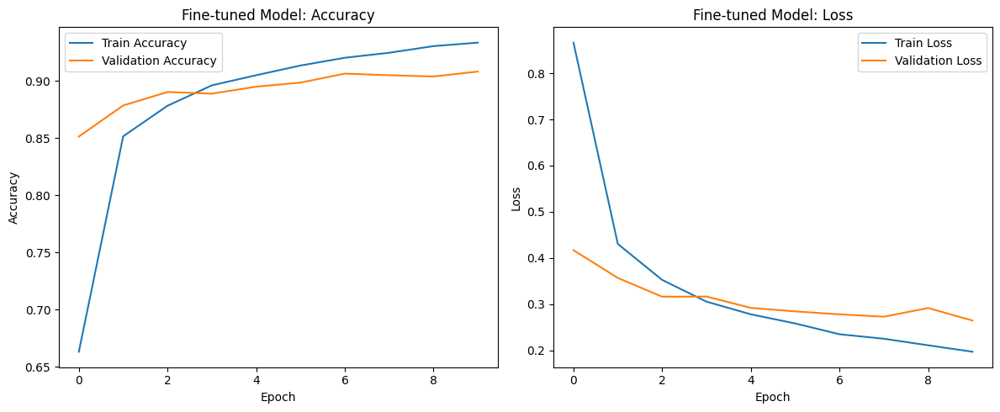

In [ ]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history_fine_tuning.history['accuracy'], label='Train Accuracy')
plt.plot(history_fine_tuning.history['val_accuracy'], label='Validation Accuracy')
plt.title('Fine-tuned Model: Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_fine_tuning.history['loss'], label='Train Loss')
plt.plot(history_fine_tuning.history['val_loss'], label='Validation Loss')
plt.title('Fine-tuned Model: Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.savefig('fine_tuning_training.png')
plt.show()


In [ ]:
# Evaluate Fine-tuned Model
fine_tuning_results = model_fine_tuning.evaluate(test_ds_tl)
print(f"Fine-tuned Model - Test Loss: {fine_tuning_results[0]:.4f}, Test Accuracy: {fine_tuning_results[1]:.4f}")


94/94 ━━━━━━━━━━━━━━━━━━━━ 17s 176ms/step - accuracy: 0.9161 - loss: 0.2541
Fine-tuned Model - Test Loss: 0.2445, Test Accuracy: 0.9173


In [ ]:
def evaluate_detailed(model, dataset, class_names):
    # Predict on test data
    all_labels = []
    all_predictions = []

    for images, labels in dataset:
        predictions = model.predict(images)
        predicted_classes = np.argmax(predictions, axis=1)

        all_labels.extend(labels.numpy())
        all_predictions.extend(predicted_classes)

    # Generate classification report
    report = classification_report(all_labels, all_predictions, target_names=class_names, digits=4)

    # Generate confusion matrix
    cm = confusion_matrix(all_labels, all_predictions)

    return report, cm

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

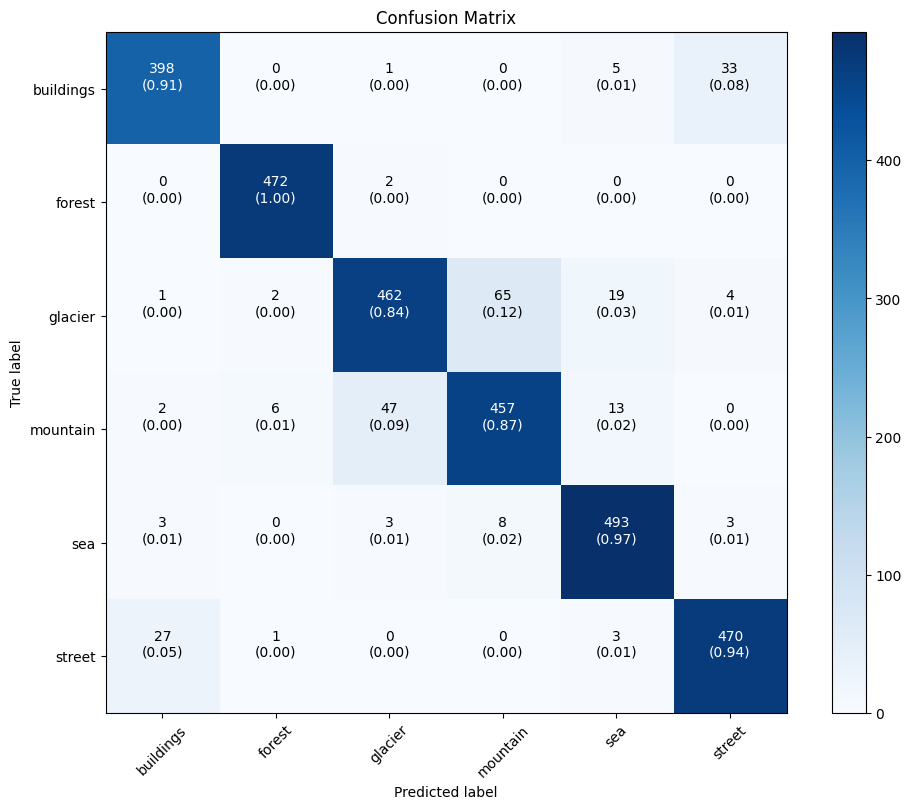

In [ ]:
# Get detailed metrics for fine-tuned model (which should perform better)
detailed_report, confusion_mat = evaluate_detailed(model_fine_tuning, test_ds_tl, class_names)
print("\nDetailed Classification Report:")
print(detailed_report)

# Confusion Matrix Visualization
plt.figure(figsize=(10, 8))
plt.imshow(confusion_mat, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

# Add normalized values to the confusion matrix
cm_normalized = confusion_mat.astype('float') / confusion_mat.sum(axis=1)[:, np.newaxis]
thresh = cm_normalized.max() / 2
for i in range(confusion_mat.shape[0]):
    for j in range(confusion_mat.shape[1]):
        plt.text(j, i, f"{confusion_mat[i, j]}\n({cm_normalized[i, j]:.2f})",
                 horizontalalignment="center",
                 color="white" if cm_normalized[i, j] > thresh else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.savefig('confusion_matrix.png')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


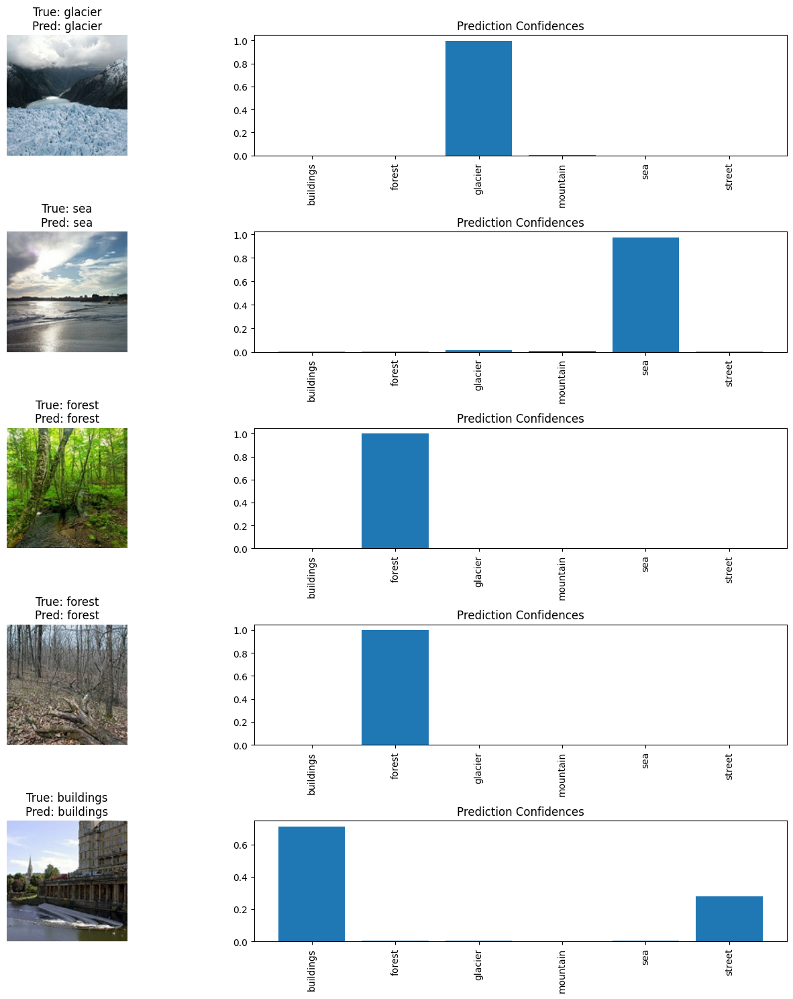

In [ ]:
def show_predictions(model, dataset, class_names, num_images=5):
    plt.figure(figsize=(15, 3*num_images))

    for images, labels in dataset.take(1):  # Take just one batch
        predictions = model.predict(images)
        predicted_classes = np.argmax(predictions, axis=1)

        for i in range(min(num_images, len(images))):
            plt.subplot(num_images, 2, 2*i+1)
            plt.imshow(images[i].numpy())
            plt.title(f"True: {class_names[labels[i]]}\nPred: {class_names[predicted_classes[i]]}")
            plt.axis('off')

            plt.subplot(num_images, 2, 2*i+2)
            plt.bar(range(len(class_names)), predictions[i])
            plt.xticks(range(len(class_names)), class_names, rotation=90)
            plt.title('Prediction Confidences')

        break  # Just use the first batch

    plt.tight_layout()
    plt.savefig('sample_predictions.png')
    plt.show()

# Show sample predictions
show_predictions(model_fine_tuning, test_ds_tl, class_names)

In [ ]:
# Replace these placeholders with your actual Part A results
baseline_accuracy = 0.0  # Replace with your Part A baseline accuracy
deeper_accuracy = 0.0    # Replace with your Part A deeper model accuracy
baseline_time = 0.0      # Replace with your Part A baseline training time
deeper_time = 0.0        # Replace with your Part A deeper model training time

print("\nModel Comparison Summary:")
print("------------------------")
print(f"Fine-tuned VGG16 Model Accuracy: {fine_tuning_results[1]:.4f}")
print(f"Feature Extraction VGG16 Model Accuracy: {feature_extraction_results[1]:.4f}")
print(f"Part A Baseline Model Accuracy: {baseline_accuracy:.4f}")
print(f"Part A Deeper Model Accuracy: {deeper_accuracy:.4f}")
print("\nTraining Time Comparison:")
print(f"Fine-tuning Training Time: {fine_tuning_time:.2f} seconds")
print(f"Feature Extraction Training Time: {feature_extraction_time:.2f} seconds")
print(f"Part A Baseline Training Time: {baseline_time:.2f} seconds")
print(f"Part A Deeper Model Training Time: {deeper_time:.2f} seconds")

# Optional Cell 16: Save the fine-tuned model for future use
model_fine_tuning.save('vgg16_fine_tuned_model.h5')
print("Fine-tuned model saved as 'vgg16_fine_tuned_model.h5'")



Model Comparison Summary:
------------------------
Fine-tuned VGG16 Model Accuracy: 0.9173
Feature Extraction VGG16 Model Accuracy: 0.8573
Part A Baseline Model Accuracy: 0.0000
Part A Deeper Model Accuracy: 0.0000

Training Time Comparison:
Fine-tuning Training Time: 1165.44 seconds
Feature Extraction Training Time: 1518.91 seconds
Part A Baseline Training Time: 0.00 seconds
Part A Deeper Model Training Time: 0.00 seconds
Fine-tuned model saved as 'vgg16_fine_tuned_model.h5'
